In [1]:
!pip install https://github.com/CellProfiling/HPA-Cell-Segmentation/archive/master.zip


  Using cached https://github.com/CellProfiling/HPA-Cell-Segmentation/archive/master.zip
  Created wheel for hpacellseg: filename=hpacellseg-0.1.8-py3-none-any.whl size=14987 sha256=31f24e48b1d17a89aa1164c55da1a954b91de4178f447672288868ee2fa0ba58
  Stored in directory: /tmp/pip-ephem-wheel-cache-h5ky39a2/wheels/c0/9f/1a/0d06f83f42c9aa212ea12a9008799a134ec3f1616c73cf8006
Successfully built hpacellseg


In [1]:
# read and visualize sample image
def read_sample_image(filename):
    
    '''
    read individual images
    of different filters (R, G, B, Y)
    and stack them.
    ---------------------------------
    Arguments:
    filename -- sample image path
    
    Returns:
    stacked_images -- stacked (RGBY) image
    '''
    
    red = cv2.imread(os.path.join(ROOT, 'train/') + filename + "_red.png", cv2.IMREAD_UNCHANGED)
    green = cv2.imread(os.path.join(ROOT, 'train/') + filename + "_green.png", cv2.IMREAD_UNCHANGED)
    blue = cv2.imread(os.path.join(ROOT, 'train/') + filename + "_blue.png", cv2.IMREAD_UNCHANGED)
    yellow = cv2.imread(os.path.join(ROOT, 'train/') + filename + "_yellow.png", cv2.IMREAD_UNCHANGED)

    stacked_images = np.transpose(np.array([red, green, blue, yellow]), (1,2,0))
    return stacked_images

def plot_all(im, label):
    
    '''
    plot all RGBY image,
    Red, Green, Blue, Yellow, 
    filters images.
    --------------------------
    Argument:
    im - image
    '''
    
    plt.figure(figsize=(15, 15))
    plt.subplot(1, 5, 1)
    plt.imshow(im[:,:,:3])
    plt.title('RGBY Image')
    plt.axis('off')
    plt.subplot(1, 5, 2)
    plt.imshow(im[:,:,0], cmap='Reds')
    plt.title('Microtubule channels')
    plt.axis('off')
    plt.subplot(1, 5, 3)
    plt.imshow(im[:,:,1], cmap='Greens')
    plt.title('Protein of Interest')
    plt.axis('off')
    plt.subplot(1, 5, 4)
    plt.imshow(im[:,:,2], cmap='Blues')
    plt.title('Nucleus')
    plt.axis('off')
    plt.subplot(1, 5, 5)
    plt.imshow(im[:,:,3], cmap='Oranges')
    plt.title('Endoplasmic Reticulum')
    plt.axis('off')
    plt.show()
    
# read and visualize sample image
def read_sample_image_seg(filename):
    
    '''
    read individual images
    of different filters (R, B, Y)
    and stack them for segmentation.
    ---------------------------------
    Arguments:
    filename -- sample image file path
    
    Returns:
    stacked_images -- stacked (RBY) image path in lists.
    '''
    
    red = os.path.join(ROOT, 'train/') + filename + "_red.png"
    blue = os.path.join(ROOT, 'train/') + filename + "_blue.png"
    yellow = os.path.join(ROOT, 'train/') + filename + "_yellow.png"

    stacked_images = [[red], [yellow], [blue]]
    return stacked_images, red, blue, yellow

# segment cell 
def segmentCell(image, segmentator):
    
    '''
    segment cell and nuclei from
    microtubules, endoplasmic reticulum,
    and nuclei (R, B, Y) filters.
    ------------------------------------
    Argument:
    image -- (R, B, Y) list of image arrays
    segmentator -- CellSegmentator class object
    
    Returns:
    cell_mask -- segmented cell mask
    '''
    
    nuc_segmentations = segmentator.pred_nuclei(image[2])
    cell_segmentations = segmentator.pred_cells(image)
    nuclei_mask, cell_mask = label_cell(nuc_segmentations[0], cell_segmentations[0])
    
    gc.collect(); del nuc_segmentations; del cell_segmentations; del nuclei_mask
    
    return cell_mask

# plot segmented cells mask, image
def plot_cell_segments(mask, red, blue, yellow):
    
    '''
    plot segmented cells
    and images
    ---------------------
    Arguments:
    mask -- cell mask
    red -- red filter image path
    blue -- blue filter image path
    yellow -- yellow filter image path
    '''
    microtubule = plt.imread(r)    
    endoplasmicrec = plt.imread(b)    
    nuclei = plt.imread(y)
    img = np.dstack((microtubule, endoplasmicrec, nuclei))
    
    plt.figure(figsize=(15, 15))
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Image')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(mask)
    plt.title('Mask')
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(img)
    plt.imshow(mask, alpha=0.6)
    plt.title('Image + Mask')
    plt.axis('off')
    plt.show()

# plot single segmented cells mask, image
def plot_single_cell(mask, red, blue, yellow):
    
    '''
    plot single cell mask
    and image
    ---------------------
    Arguments:
    mask -- cell mask
    red -- red filter image path
    blue -- blue filter image path
    yellow -- yellow filter image path
    '''
    microtubule = plt.imread(r)    
    endoplasmicrec = plt.imread(b)    
    nuclei = plt.imread(y)
    img = np.dstack((microtubule, endoplasmicrec, nuclei))
    
    contours= cv2.findContours(mask.astype('uint8'),
                               cv2.RETR_TREE, 
                               cv2.CHAIN_APPROX_SIMPLE)

    areas = [cv2.contourArea(c) for c in contours[0]]
    x = np.argsort(areas)
    cnt = contours[0][x[-1]]
    x,yc,w,h = cv2.boundingRect(cnt)
    
    plt.figure(figsize=(15, 15))
    plt.subplot(1, 3, 1)
    plt.imshow(img[yc:yc+h, x:x+w])
    plt.title('Cell Image')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(mask[yc:yc+h, x:x+w])
    plt.title('Cell Mask')
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(img[yc:yc+h, x:x+w])
    plt.imshow(mask[yc:yc+h, x:x+w], alpha=0.6)
    plt.title('Cell Image + Mask')
    plt.axis('off')
    plt.show()
    
def binary_mask(rgby_images):
    
    '''
    generate masks from 
    rgby images.
    --------------------
    Arguments:
    rgby_images -- RGBY cell images
    
    Return:
    mask -- binary mask.
    '''
    pass

In [2]:


# basic 
import warnings
import os, gc, cv2
import numpy as np
import pandas as pd
from glob import glob
from tqdm.notebook import tqdm

# visualize
import seaborn as sns
import matplotlib.pyplot as plt

# segmentation tool
import hpacellseg.cellsegmentator as cellsegmentator
from hpacellseg.utils import label_cell, label_nuclei

%matplotlib inline
warnings.filterwarnings('ignore')



In [3]:
print('/home/username/Documents/Data Segmentation')
ROOT = '/home/username/Documents/Data Segmentation/'
os.listdir(ROOT)

/home/username/Documents/Data Segmentation


['train_tfrecords.zip',
 'dpn_unet_cell_3ch_v1.pth',
 'train.csv',
 'dpn_unet_cell_3ch_v1.pth.zip',
 'train.zip',
 'dpn_unet_nuclei_v1.pth',
 'dpn_unet_nuclei_v1.pth.zip',
 'train_tfrecords',
 'test',
 'train',
 'test.zip',
 'sample_submission.csv']

# Train Data

In [4]:
train_df = pd.read_csv(os.path.join(ROOT, 'train.csv'))
train_df.head()




,ID,Label
0,5c27f04c-bb99-11e8-b2b9-ac1f6b6435d0,8|5|0
1,5fb643ee-bb99-11e8-b2b9-ac1f6b6435d0,14|0
2,60b57878-bb99-11e8-b2b9-ac1f6b6435d0,6|1
3,5c1a898e-bb99-11e8-b2b9-ac1f6b6435d0,16|10
4,5b931256-bb99-11e8-b2b9-ac1f6b6435d0,14|0


# Data Count

In [5]:
print(f'We have {train_df.shape[0]} rows and {train_df.shape[1]} columns in our train_df.csv.')
print(f'Missing values in train_df.csv in each columns:\n{train_df.isnull().sum()}')
print('Unique Values in each column of train_df.csv')
print('##########################################')
for col in train_df:
    print(f'{col}: {train_df[col].nunique()}')

We have 21806 rows and 2 columns in our train_df.csv.
Missing values in train_df.csv in each columns:
ID       0
Label    0
dtype: int64
Unique Values in each column of train_df.csv
##########################################
ID: 21806
Label: 432


# Sample Submission

In [6]:
sample_sub = pd.read_csv(os.path.join(ROOT, 'sample_submission.csv'))
sample_sub.head()

,ID,ImageWidth,ImageHeight,PredictionString
0,0040581b-f1f2-4fbe-b043-b6bfea5404bb,2048,2048,0 1 eNoLCAgIMAEABJkBdQ==
1,004a270d-34a2-4d60-bbe4-365fca868193,2048,2048,0 1 eNoLCAgIMAEABJkBdQ==
2,00537262-883c-4b37-a3a1-a4931b6faea5,2048,2048,0 1 eNoLCAgIMAEABJkBdQ==
3,00c9a1c9-2f06-476f-8b0d-6d01032874a2,2048,2048,0 1 eNoLCAgIMAEABJkBdQ==
4,0173029a-161d-40ef-af28-2342915b22fb,3072,3072,0 1 eNoLCAgIsAQABJ4Beg==


# Data Analysis

In [7]:
# spliting label column
train_df["Label"] = train_df["Label"].str.split("|")

# class labels
class_labels = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18']

# binarizing each label/class
for label in tqdm(class_labels):
    train_df[label] = train_df['Label'].map(lambda result: 1 if label in result else 0)

# rename column
train_df.columns = ['ID', 'Label', 'Nucleoplasm', 'Nuclear membrane', 'Nucleoli', 'Nucleoli fibrillar center',
                    'Nuclear speckles', 'Nuclear bodies', 'Endoplasmic reticulum', 'Golgi apparatus', 'Intermediate filaments',
                    'Actin filaments', 'Microtubules', 'Mitotic spindle', 'Centrosome', 'Plasma membrane', 'Mitochondria',
                    'Aggresome', 'Cytosol', 'Vesicles and punctate cytosolic patterns', 'Negative']

train_df

,ID,Label,Nucleoplasm,Nuclear membrane,Nucleoli,Nucleoli fibrillar center,Nuclear speckles,Nuclear bodies,Endoplasmic reticulum,Golgi apparatus,...,Actin filaments,Microtubules,Mitotic spindle,Centrosome,Plasma membrane,Mitochondria,Aggresome,Cytosol,Vesicles and punctate cytosolic patterns,Negative
0,5c27f04c-bb99-11e8-b2b9-ac1f6b6435d0,"[8, 5, 0]",1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,5fb643ee-bb99-11e8-b2b9-ac1f6b6435d0,"[14, 0]",1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,60b57878-bb99-11e8-b2b9-ac1f6b6435d0,"[6, 1]",0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,5c1a898e-bb99-11e8-b2b9-ac1f6b6435d0,"[16, 10]",0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
4,5b931256-bb99-11e8-b2b9-ac1f6b6435d0,"[14, 0]",1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21801,dd0989c4-bbca-11e8-b2bc-ac1f6b6435d0,[14],0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
21802,dd1f7fb8-bbca-11e8-b2bc-ac1f6b6435d0,"[3, 0]",1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21803,dd5cb36a-bbca-11e8-b2bc-ac1f6b6435d0,"[14, 0]",1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
21804,df573730-bbca-11e8-b2bc-ac1f6b6435d0,[14],0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [8]:
class_counts = train_df.sum().drop(['ID', 'Label']).sort_values(ascending=False)

print('Per class count in train dataset')
print('-------------------------------------------------')
for column in class_counts.keys():
    print(f"The class {column} has {train_df[column].sum()} samples")

Per class count in train dataset
-------------------------------------------------
The class Nucleoplasm has 8797 samples
The class Cytosol has 5685 samples
The class Plasma membrane has 3111 samples
The class Nucleoli has 2451 samples
The class Mitochondria has 2013 samples
The class Golgi apparatus has 1846 samples
The class Nuclear bodies has 1792 samples
The class Centrosome has 1734 samples
The class Nuclear speckles has 1425 samples
The class Nucleoli fibrillar center has 1262 samples
The class Nuclear membrane has 1095 samples
The class Actin filaments has 998 samples
The class Intermediate filaments has 964 samples
The class Microtubules has 818 samples
The class Endoplasmic reticulum has 775 samples
The class Vesicles and punctate cytosolic patterns has 593 samples
The class Aggresome has 252 samples
The class Mitotic spindle has 78 samples
The class Negative has 34 samples


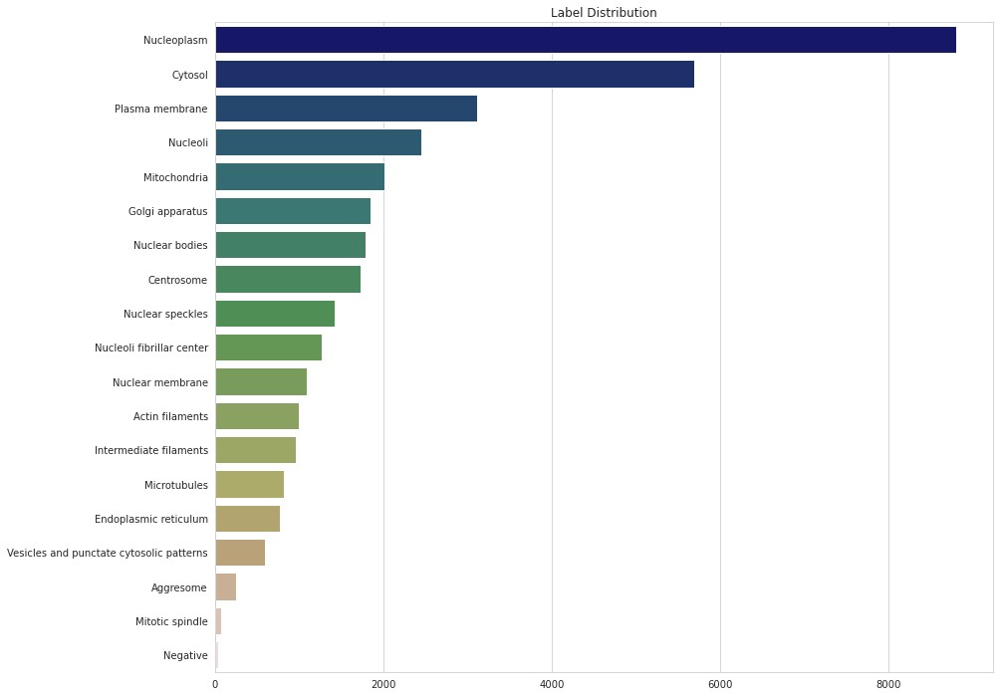

In [9]:
plt.figure(figsize=(14,12))
with sns.axes_style("whitegrid"):
    aa = sns.barplot(y=class_counts.index.values, x=class_counts.values, palette='gist_earth')
    plt.title("Label Distribution")

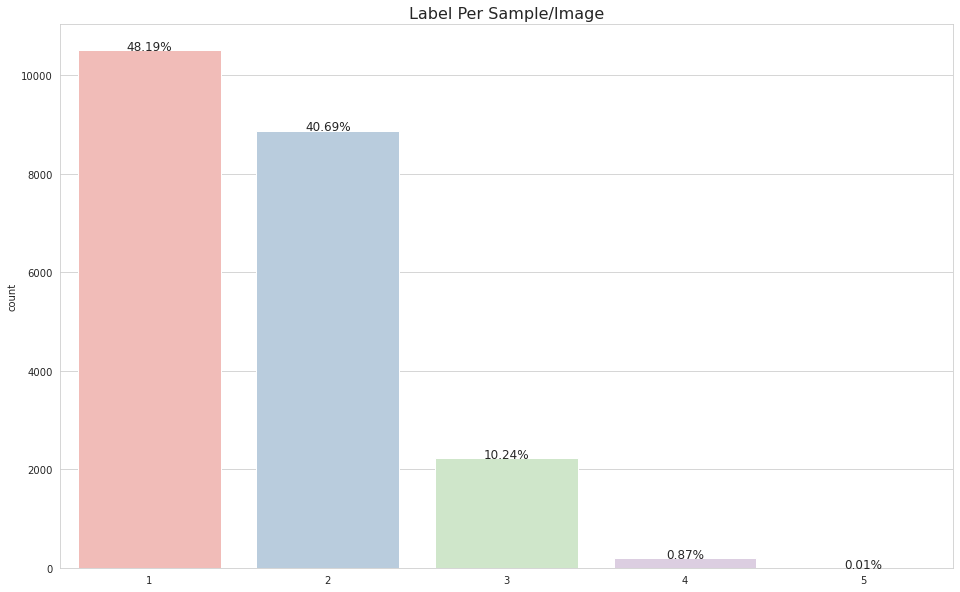

In [10]:
label_per_image = train_df.drop(['ID', 'Label'], axis=1).sum(axis=1)

plt.figure(figsize=(16,10))
with sns.axes_style("whitegrid"):
    ax = sns.countplot(label_per_image, palette='Pastel1')
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(height/len(label_per_image)*100),
                ha="center", fontsize=12)
    plt.title("Label Per Sample/Image", fontsize=16)

In [11]:
train_df.head()

,ID,Label,Nucleoplasm,Nuclear membrane,Nucleoli,Nucleoli fibrillar center,Nuclear speckles,Nuclear bodies,Endoplasmic reticulum,Golgi apparatus,...,Actin filaments,Microtubules,Mitotic spindle,Centrosome,Plasma membrane,Mitochondria,Aggresome,Cytosol,Vesicles and punctate cytosolic patterns,Negative
0,5c27f04c-bb99-11e8-b2b9-ac1f6b6435d0,"[8, 5, 0]",1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,5fb643ee-bb99-11e8-b2b9-ac1f6b6435d0,"[14, 0]",1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,60b57878-bb99-11e8-b2b9-ac1f6b6435d0,"[6, 1]",0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,5c1a898e-bb99-11e8-b2b9-ac1f6b6435d0,"[16, 10]",0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
4,5b931256-bb99-11e8-b2b9-ac1f6b6435d0,"[14, 0]",1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [12]:
train = train_df.loc[train_df['Label'].apply(lambda x: len(x)==1)==True]


Nucleoplasm


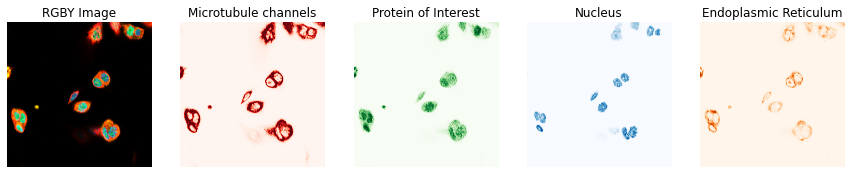

Nuclear membrane


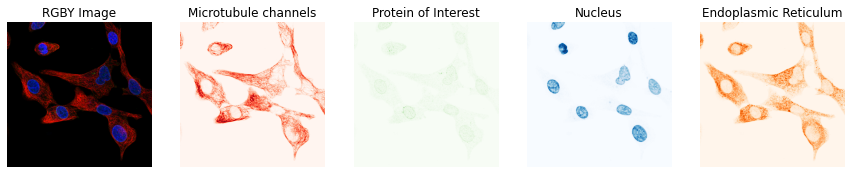

Nucleoli


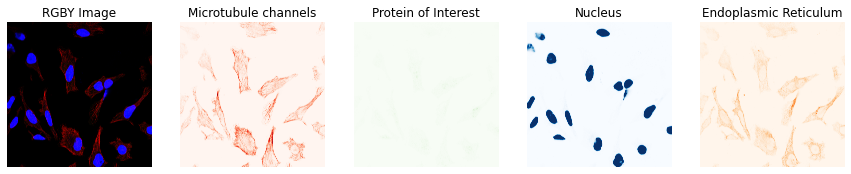

Nucleoli fibrillar center


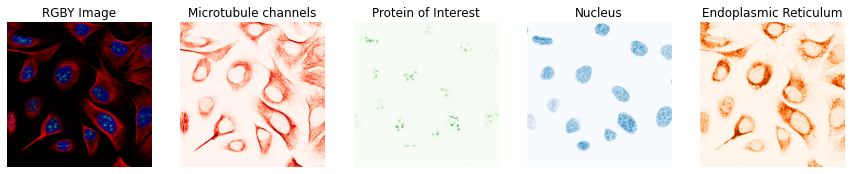

Nuclear speckles


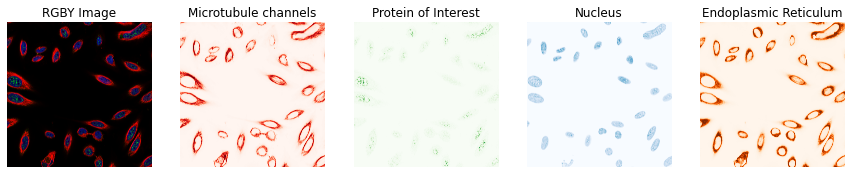

Nuclear bodies


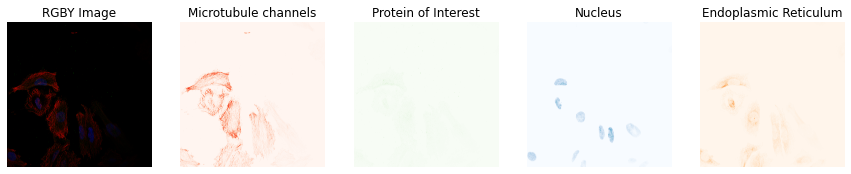

Endoplasmic reticulum


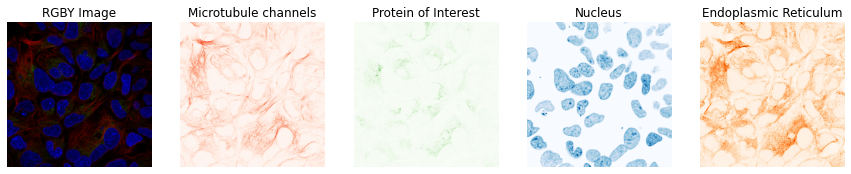

Golgi apparatus


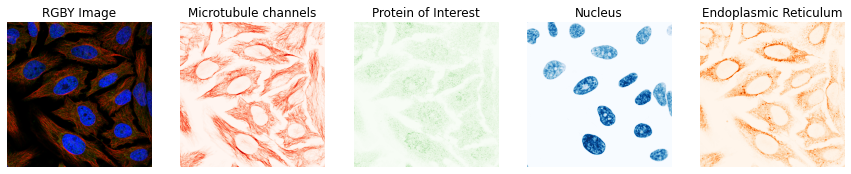

Intermediate filaments


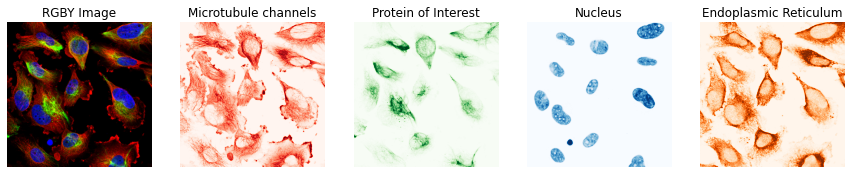

Actin filaments


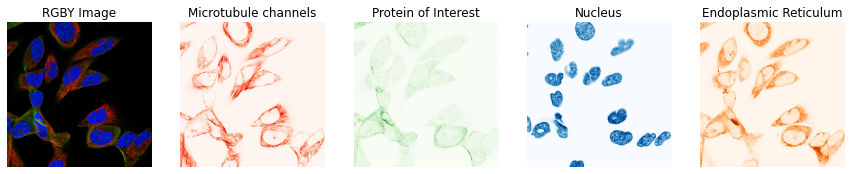

Microtubules


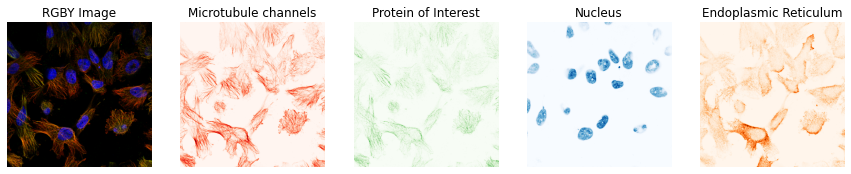

Mitotic spindle


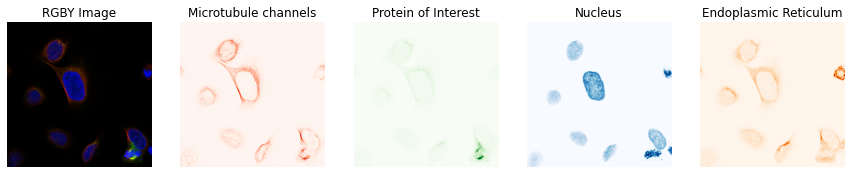

Centrosome


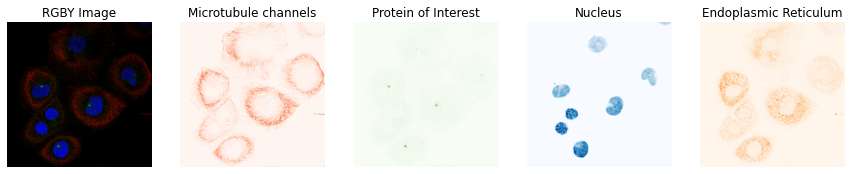

Plasma membrane


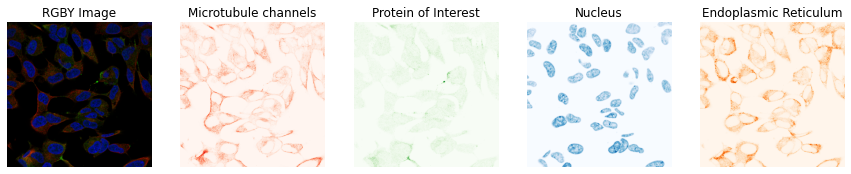

Mitochondria


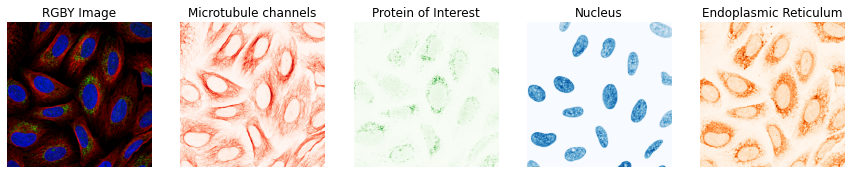

Aggresome


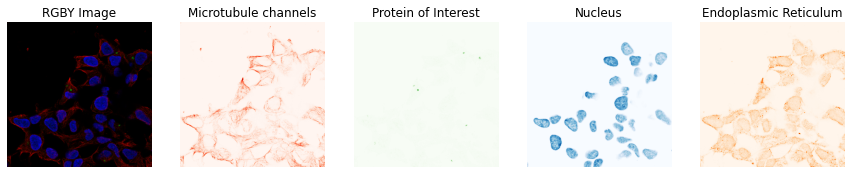

Cytosol


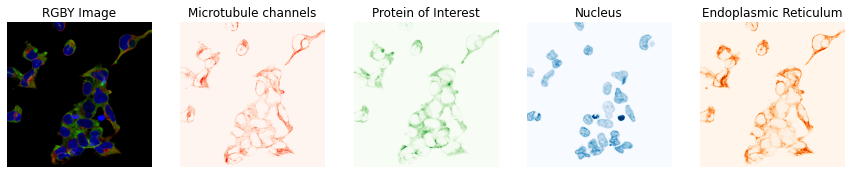

Vesicles and punctate cytosolic patterns


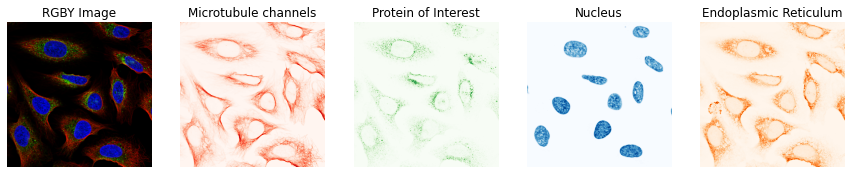

Negative


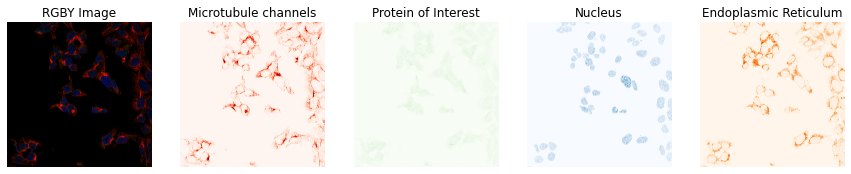

In [19]:

for label in train_df.drop(['ID', 'Label'], axis=1):
    print(label)
    im = read_sample_image(train[train[label]==1].sample(1).ID.to_string().split(' ')[4])
    plot_all(im, label)


In [53]:
NUC_MODEL = "dpn_unet_nuclei_v1.pth"
CELL_MODEL = "dpn_unet_cell_3ch_v1.pth"
segmentator = cellsegmentator.CellSegmentator(
    NUC_MODEL,
    CELL_MODEL,
    scale_factor=0.25,
    device="cpu",
    padding=False,
    multi_channel_model=True,
)



please compile abn


Nucleoplasm


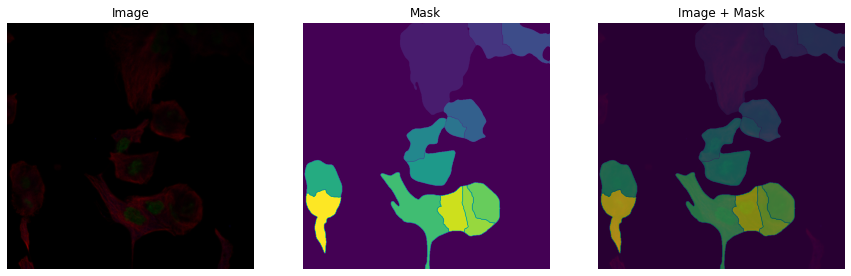

Nuclear membrane


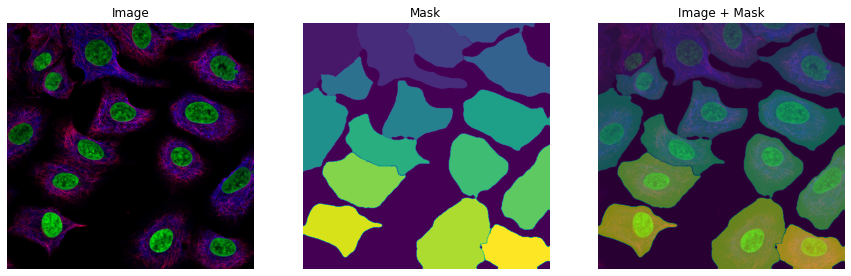

Nucleoli


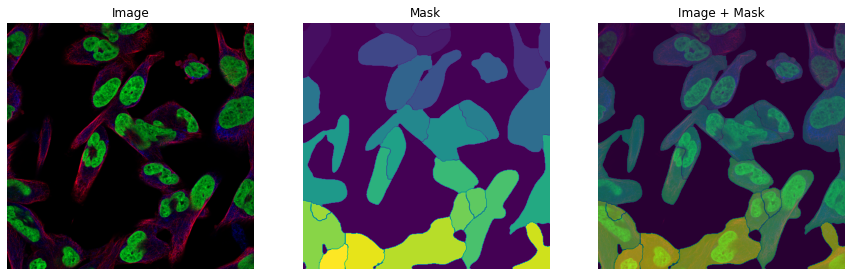

Nucleoli fibrillar center


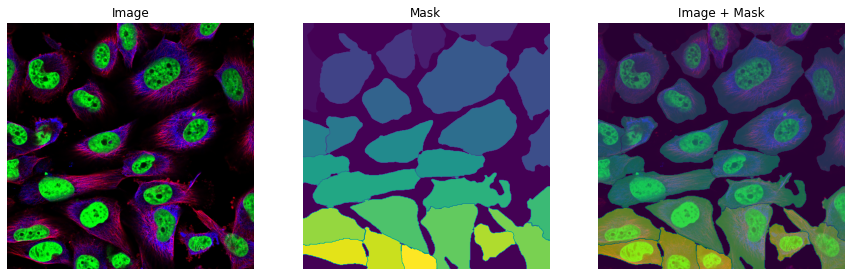

Nuclear speckles


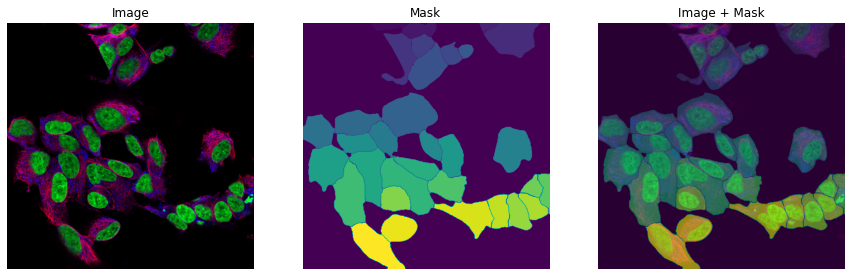

Nuclear bodies


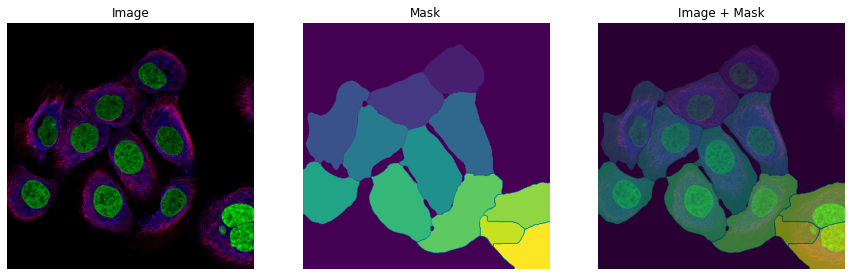

Endoplasmic reticulum


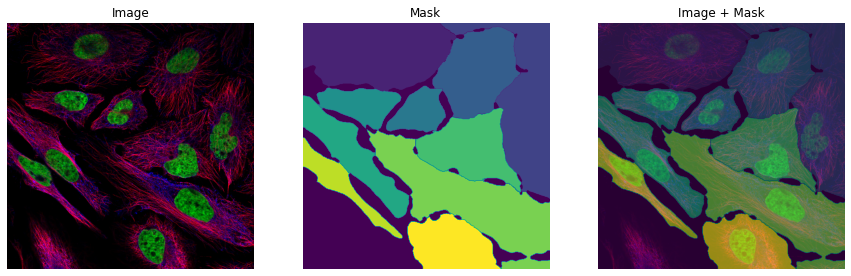

Golgi apparatus


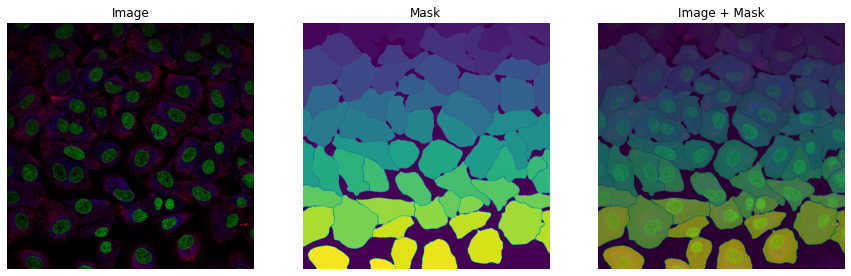

Intermediate filaments


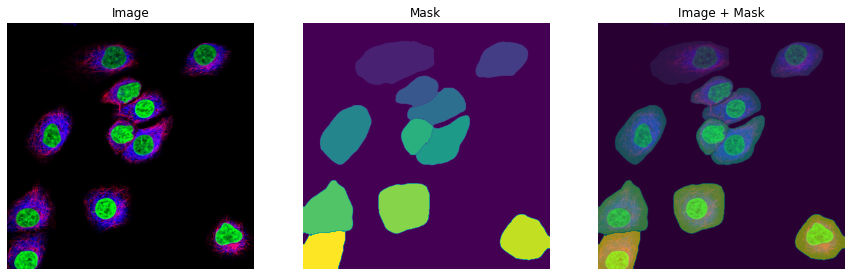

Actin filaments


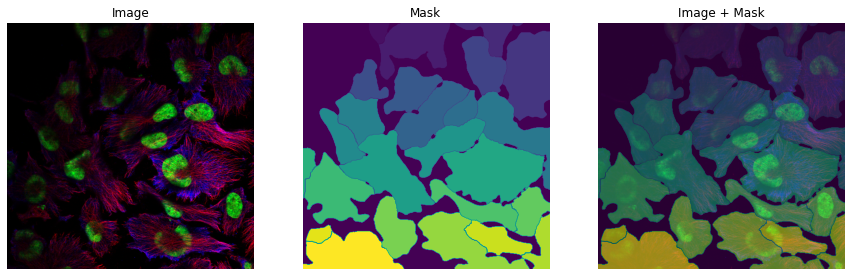

Microtubules


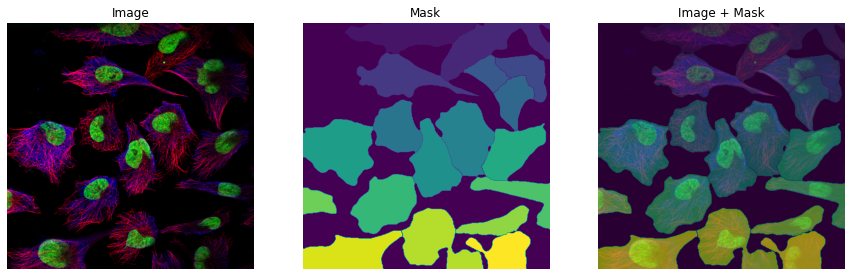

Mitotic spindle


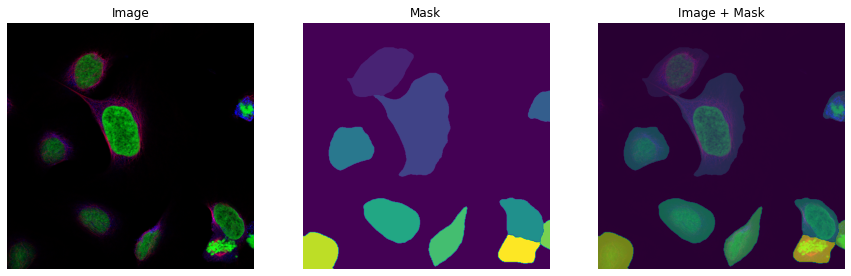

Centrosome


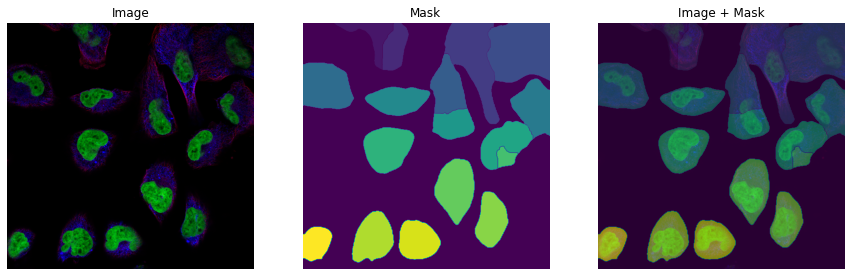

Plasma membrane


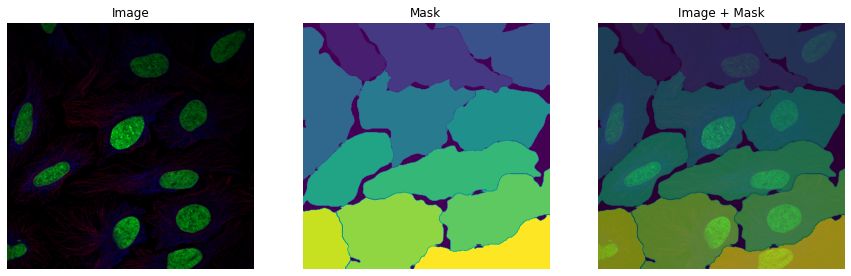

Mitochondria


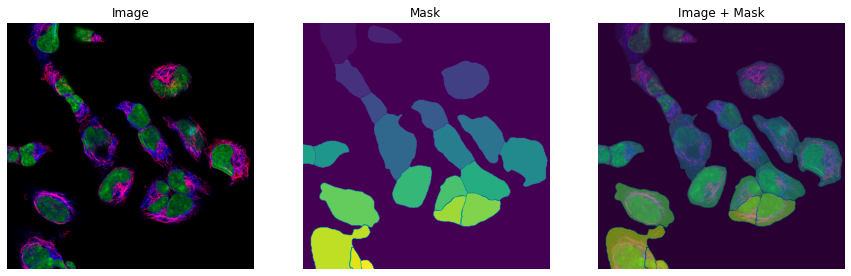

Aggresome


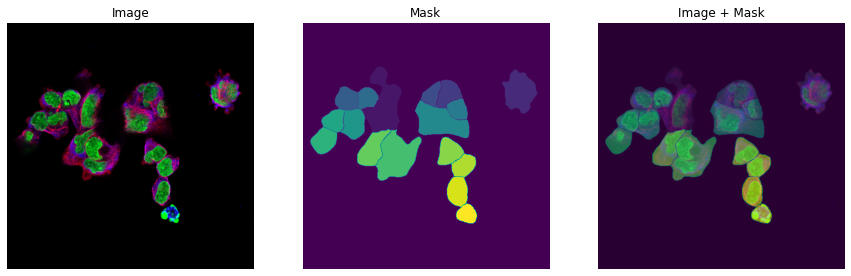

Cytosol


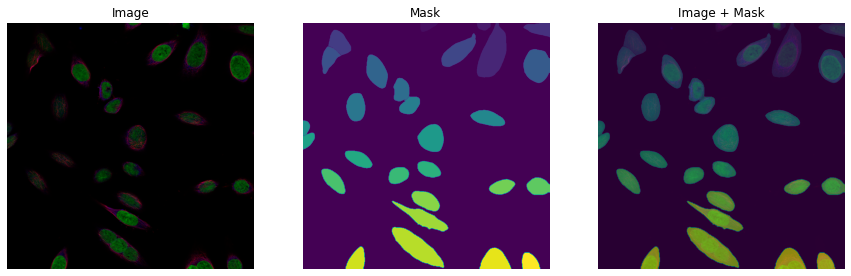

Vesicles and punctate cytosolic patterns


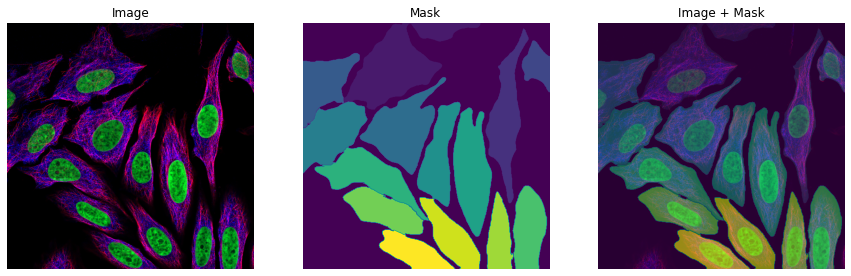

Negative


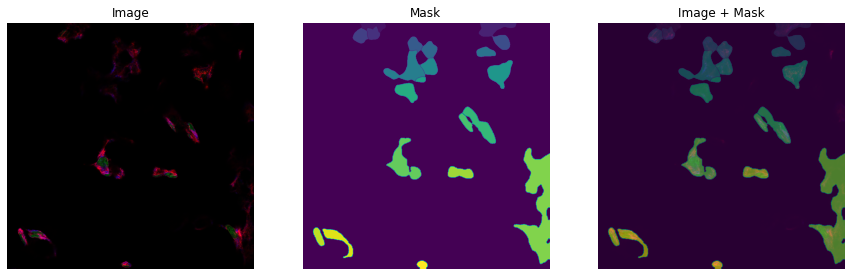

In [19]:
for label in train_df.drop(['ID', 'Label'], axis=1):
    print(label)
    im, r, b, y = read_sample_image_seg(train[train[label]==1].sample(1).ID.to_string().split(' ')[4])
    mask = segmentCell(im, segmentator)
    plot_cell_segments(mask, r, b, y)

Nucleoplasm


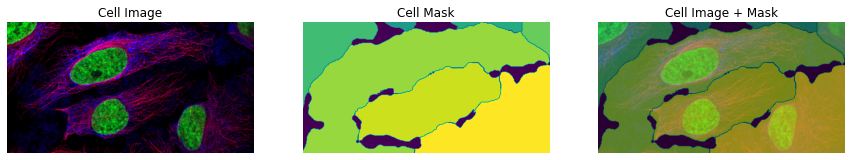

Nuclear membrane


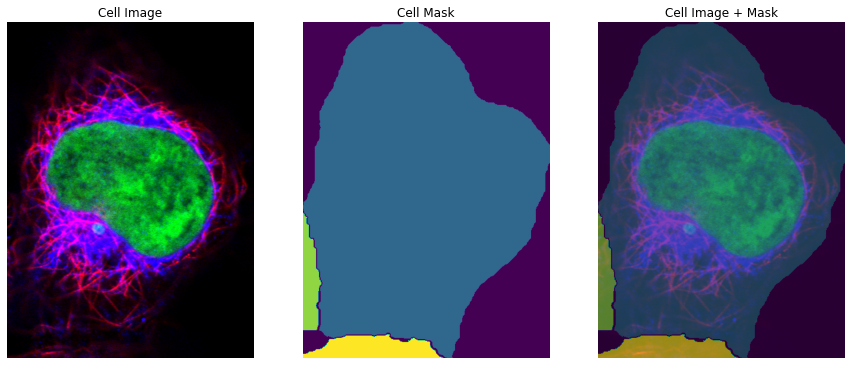

Nucleoli


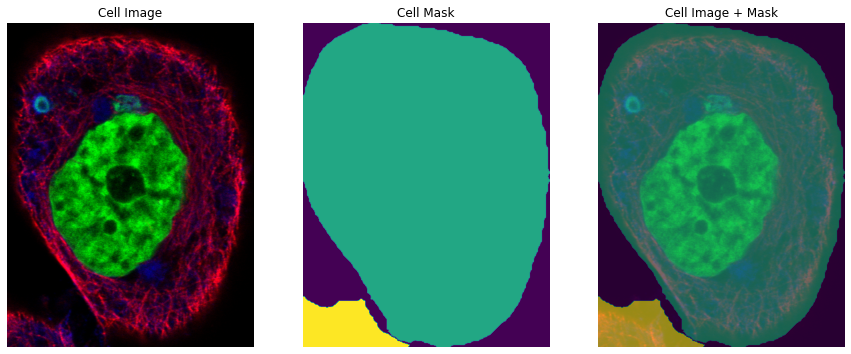

Nucleoli fibrillar center


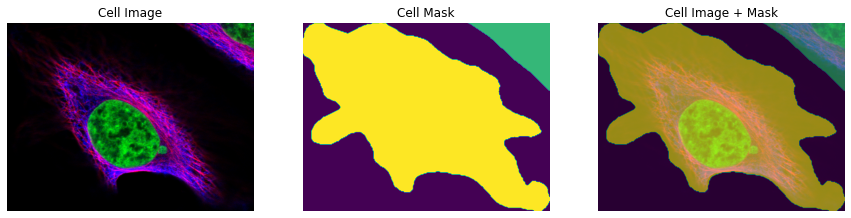

Nuclear speckles


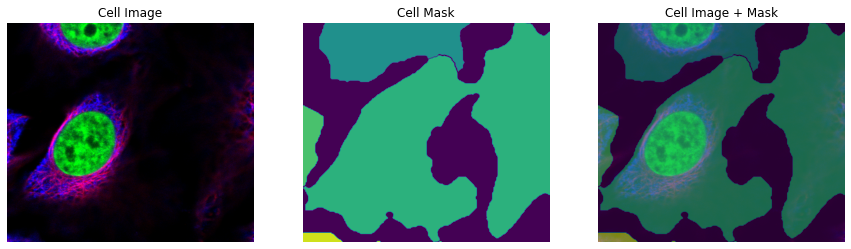

Nuclear bodies


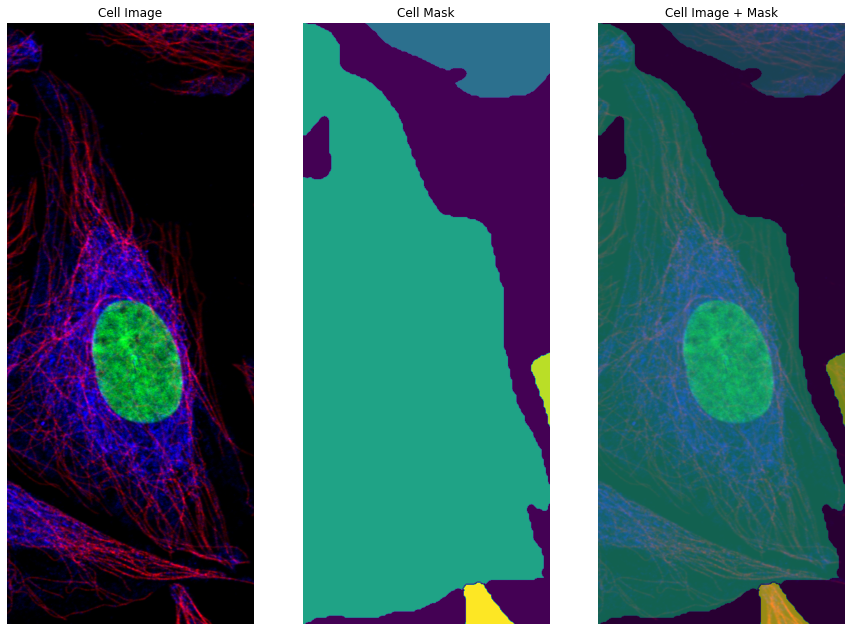

Endoplasmic reticulum


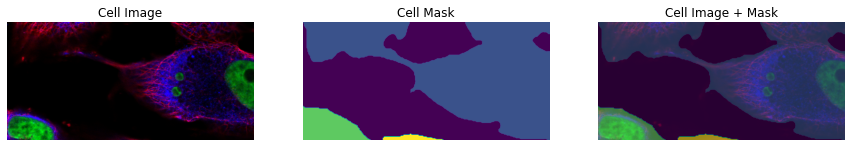

Golgi apparatus


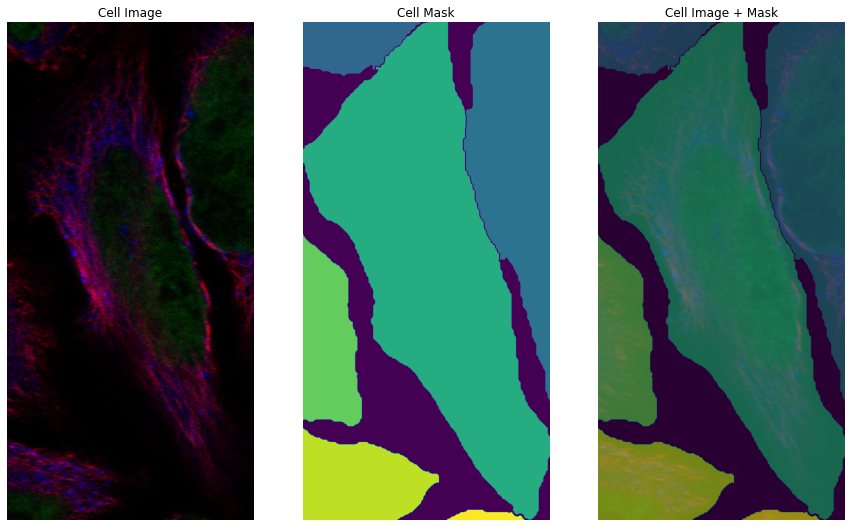

Intermediate filaments


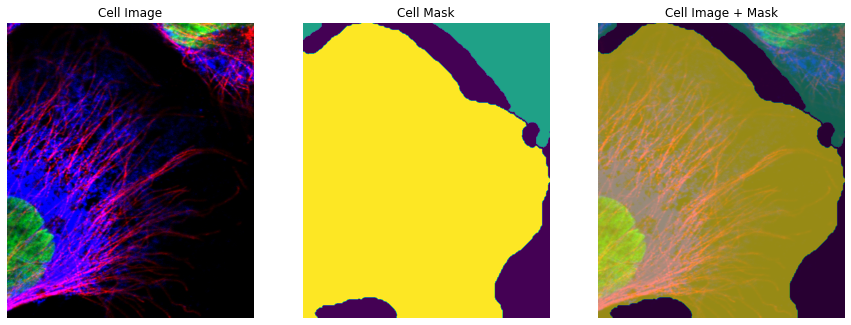

Actin filaments


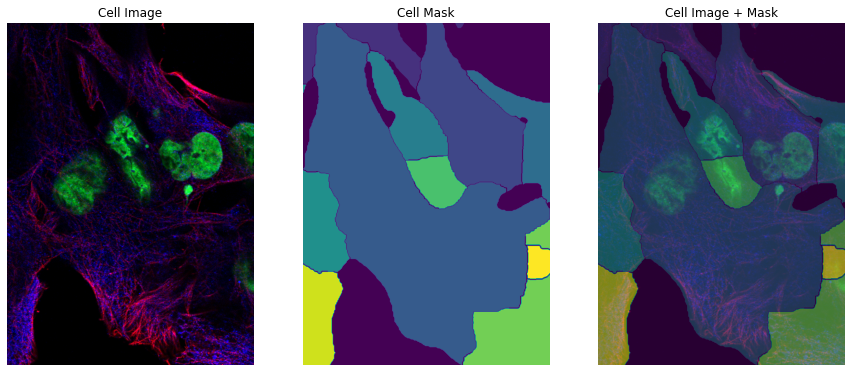

Microtubules


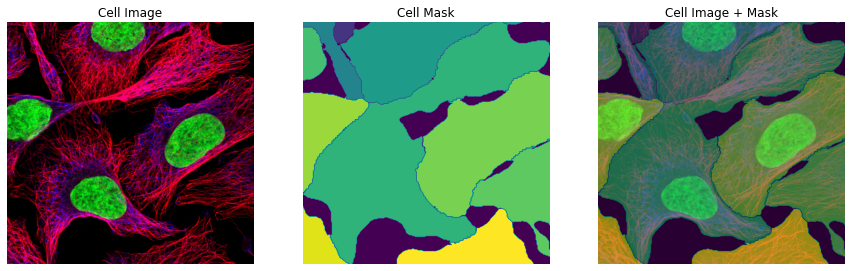

Mitotic spindle


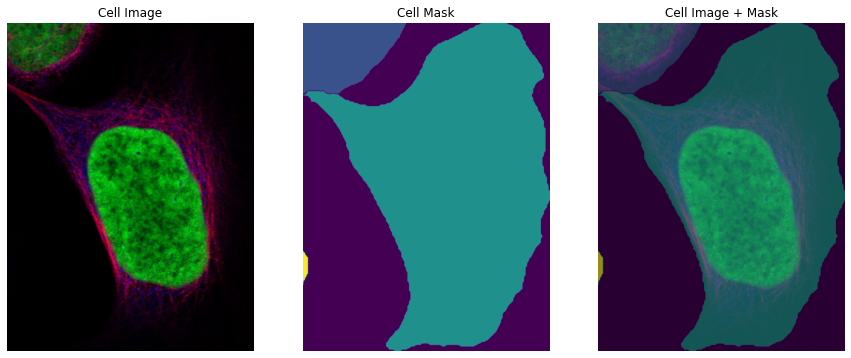

Centrosome


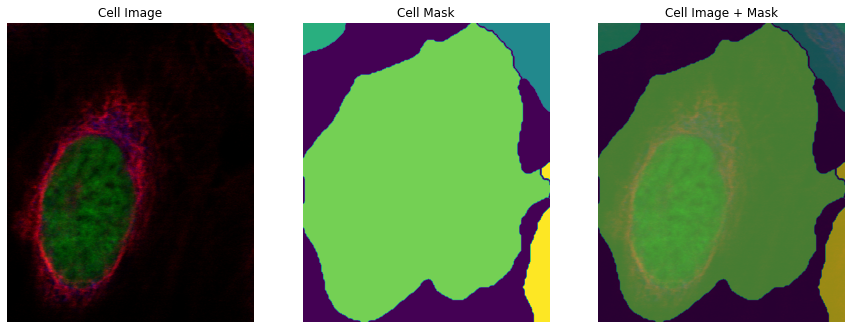

Plasma membrane


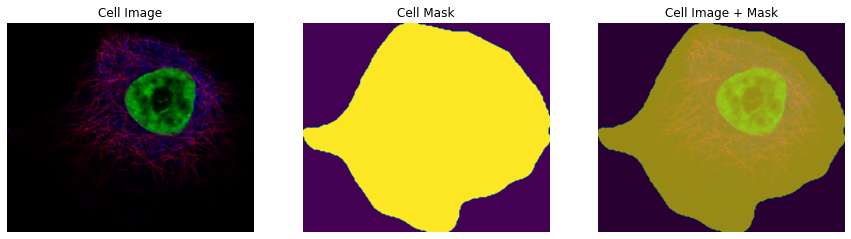

Mitochondria


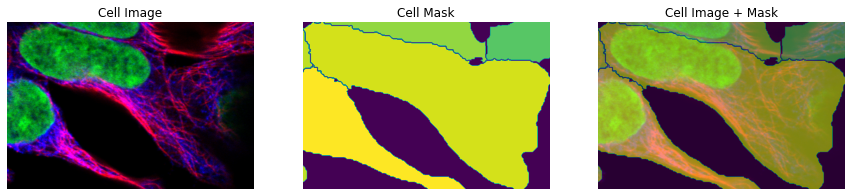

Aggresome


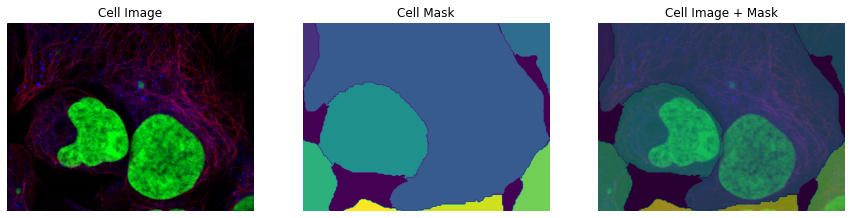

Cytosol


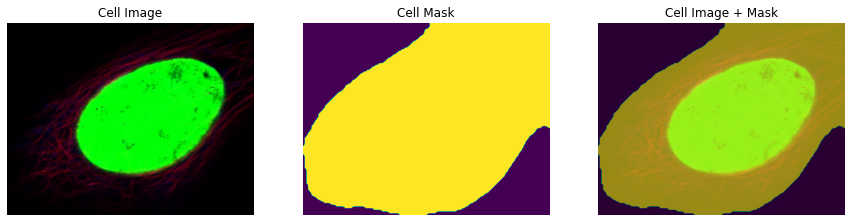

Vesicles and punctate cytosolic patterns


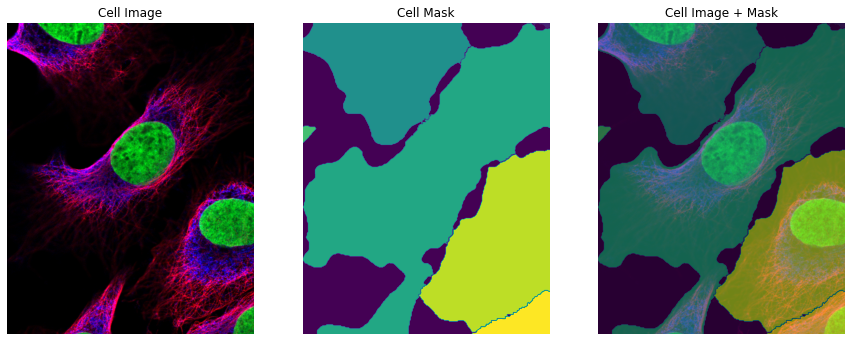

Negative


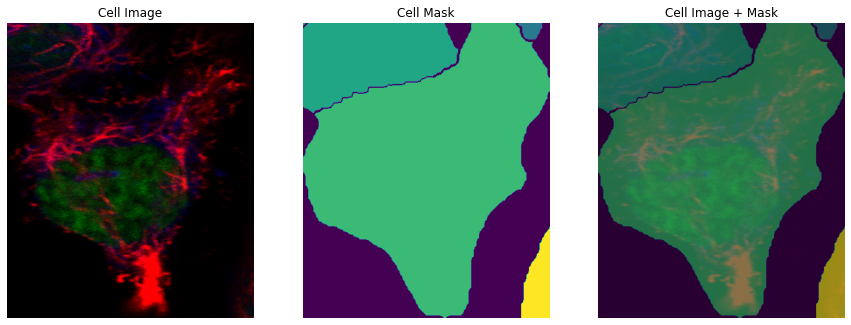

In [21]:
for label in train_df.drop(['ID', 'Label'], axis=1):
    print(label)
    im, r, b, y = read_sample_image_seg(train[train[label]==1].sample(1).ID.to_string().split(' ')[4])
    mask = segmentCell(im, segmentator)
    plot_single_cell(mask, r, b, y)